In [23]:
%pip install kneed

Note: you may need to restart the kernel to use updated packages.


In [24]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.metrics.pairwise import pairwise_distances_argmin
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import Birch
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score

In [25]:
df = pd.read_csv('/Users/roberthulsy/Data_Camp/Homework/project_4/Mental health Depression disorder Data.csv')

In [26]:
# Load the data
column_types = {
    'country': 'str',
    'year': 'int64',
    'schizophrenia': 'float64',
    'bipolar_disorder': 'float64',
    'eating_disorders': 'float64',
    'anxiety_disorders': 'float64',
    'drug_use_disorders': 'float64',
    'depression': 'float64',
    'alcohol_use_disorders': 'float64',
}

data = pd.read_csv('/Users/roberthulsy/Data_Camp/Homework/project_4/Mental health Depression disorder Data.csv', dtype=column_types)
df = pd.DataFrame(data)
df.head()

,Unnamed: 0,country,code,year,schizophrenia,bipolar_disorder,eating_disorders,anxiety_disorders,drug_use_disorders,depression,alcohol_use_disorders
0,0,Afghanistan,AFG,1990,0.160560,0.697779,0.101855,4.828830,1.677082,4.071831,0.672404
1,1,Afghanistan,AFG,1991,0.160312,0.697961,0.099313,4.829740,1.684746,4.079531,0.671768
2,2,Afghanistan,AFG,1992,0.160135,0.698107,0.096692,4.831108,1.694334,4.088358,0.670644
3,3,Afghanistan,AFG,1993,0.160037,0.698257,0.094336,4.830864,1.705320,4.096190,0.669738
4,4,Afghanistan,AFG,1994,0.160022,0.698469,0.092439,4.829423,1.716069,4.099582,0.669260


In [27]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5488 entries, 0 to 5487
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             5488 non-null   int64  
 1   country                5488 non-null   object 
 2   code                   5488 non-null   object 
 3   year                   5488 non-null   int64  
 4   schizophrenia          5488 non-null   float64
 5   bipolar_disorder       5488 non-null   float64
 6   eating_disorders       5488 non-null   float64
 7   anxiety_disorders      5488 non-null   float64
 8   drug_use_disorders     5488 non-null   float64
 9   depression             5488 non-null   float64
 10  alcohol_use_disorders  5488 non-null   float64
dtypes: float64(7), int64(2), object(2)
memory usage: 471.8+ KB


In [28]:
df.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,5488.0,2743.500000,1584.393470,0.000000,1371.750000,2743.500000,4115.250000,5487.000000
year,5488.0,2003.500000,8.078483,1990.000000,1996.750000,2003.500000,2010.250000,2017.000000
schizophrenia,5488.0,0.208183,0.041998,0.146902,0.179452,0.198510,0.230553,0.375110
bipolar_disorder,5488.0,0.716884,0.164246,0.314535,0.615732,0.693954,0.830217,1.206597
eating_disorders,5488.0,0.234023,0.154147,0.073908,0.121761,0.180378,0.278681,0.943991
anxiety_disorders,5488.0,3.946979,1.134810,2.023393,3.178912,3.515140,4.659540,8.967330
drug_use_disorders,5488.0,0.833328,0.441199,0.383650,0.524018,0.709090,0.906843,3.452476
depression,5488.0,3.474504,0.671741,2.139903,2.955355,3.461421,3.877343,6.602754
alcohol_use_disorders,5488.0,1.562273,0.861973,0.446940,0.961545,1.466906,1.853683,5.474668


In [29]:


# Scatter plot of the data schizophrenia	bipolar_disorder	eating_disorders	anxiety_disorders	drug_use_disorders	depression	alcohol_use_disorders
fig1 = px.scatter(df, x="schizophrenia", y="depression", color="anxiety_disorders", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig1.show()
fig2 = px.scatter(df, x="depression", y="anxiety_disorders", color="bipolar_disorder", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig2.show()
fig3 = px.scatter(df, x="anxiety_disorders", y="bipolar_disorder", color="eating_disorders", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig3.show()
fig4 = px.scatter(df, x="bipolar_disorder", y="eating_disorders", color="schizophrenia", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig4.show()



In [30]:
fig = make_subplots(rows=3, cols=2, subplot_titles=("schizophrenia vs depression", "depression vs anxiety_disorders", "anxiety_disorders vs bipolar_disorder", "bipolar_disorder vs eating_disorders"))

fig.add_trace(go.Scatter(x=df['schizophrenia'], y=df['depression'], mode='markers', marker=dict(color=df['anxiety_disorders'], showscale=True, colorbar=dict(title="anxiety_disorders")), hovertext=df['anxiety_disorders']), row=1, col=1)

fig.add_trace(go.Scatter(x=df['depression'], y=df['anxiety_disorders'], mode='markers', marker=dict(color=df['bipolar_disorder'], showscale=True, colorbar=dict(title="bipolar_disorder")), hovertext=df['bipolar_disorder']), row=1, col=2)

fig.add_trace(go.Scatter(x=df['anxiety_disorders'], y=df['bipolar_disorder'], mode='markers', marker=dict(color=df['eating_disorders'], showscale=True, colorbar=dict(title="eating_disorders")), hovertext=df['eating_disorders']), row=2, col=1)

fig.add_trace(go.Scatter(x=df['bipolar_disorder'], y=df['eating_disorders'], mode='markers', marker=dict(color=df['schizophrenia'], showscale=True, colorbar=dict(title="schizophrenia")), hovertext=df['schizophrenia']), row=2, col=2)

fig.update_layout(height=800, width=1200, template="simple_white")
fig.show()

In [31]:
fig = make_subplots(rows=3, cols=2, subplot_titles=("schizophrenia vs depression", "depression vs anxiety_disorders", "anxiety_disorders vs bipolar_disorder", "bipolar_disorder vs eating_disorders"))

fig.add_trace(go.Scatter(x=df['schizophrenia'], y=df['depression'], mode='markers', marker=dict(color=df['anxiety_disorders'], showscale=True, colorbar=dict(title="anxiety_disorders")), hovertext=df['anxiety_disorders']), row=1, col=1)

fig.add_trace(go.Scatter(x=df['depression'], y=df['anxiety_disorders'], mode='markers', marker=dict(color=df['bipolar_disorder'], showscale=True, colorbar=dict(title="bipolar_disorder")), hovertext=df['bipolar_disorder']), row=1, col=2)

fig.add_trace(go.Scatter(x=df['anxiety_disorders'], y=df['bipolar_disorder'], mode='markers', marker=dict(color=df['eating_disorders'], showscale=True, colorbar=dict(title="eating_disorders")), hovertext=df['eating_disorders']), row=2, col=1)

fig.add_trace(go.Scatter(x=df['bipolar_disorder'], y=df['eating_disorders'], mode='markers', marker=dict(color=df['schizophrenia'], showscale=True, colorbar=dict(title="schizophrenia")), hovertext=df['schizophrenia']), row=2, col=2)

fig.update_layout(height=800, width=1200, template="simple_white")
fig.show()

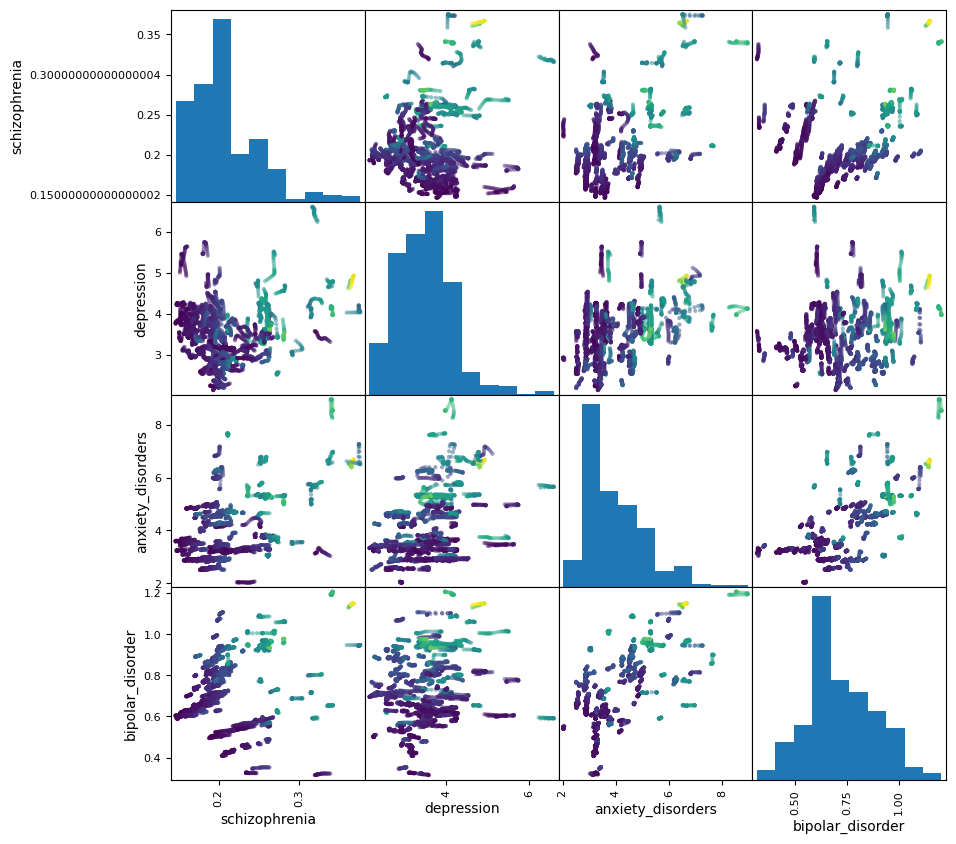

In [32]:
pd.plotting.scatter_matrix(df[["schizophrenia", "depression", "anxiety_disorders", "bipolar_disorder"]], c=df["eating_disorders"], figsize=(10, 10))
plt.show()


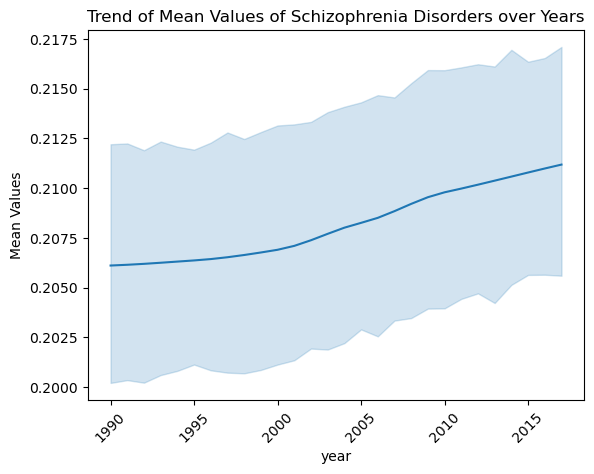

In [33]:
if 'year' in df.columns:
    sns.lineplot(x='year', y='schizophrenia', data=df)
    plt.ylabel('Mean Values')
    plt.title('Trend of Mean Values of Schizophrenia Disorders over Years')
    plt.xticks(rotation=45)
    plt.show()
else:
    print("The 'year' column does not exist in the dataframe.")


# Unsupervised Machine Learning Models


In [45]:
features = ['schizophrenia', 'bipolar_disorder', 'eating_disorders', 'anxiety_disorders', 'drug_use_disorders', 'depression', 'alcohol_use_disorders']


In [46]:
# Agglomerative Clustering
agg_cluster = AgglomerativeClustering(n_clusters=3, linkage='ward')

In [47]:
agg_cluster.fit(df[features])
labels = agg_cluster.labels_

Text(0.5, 1.0, 'With Clustering')

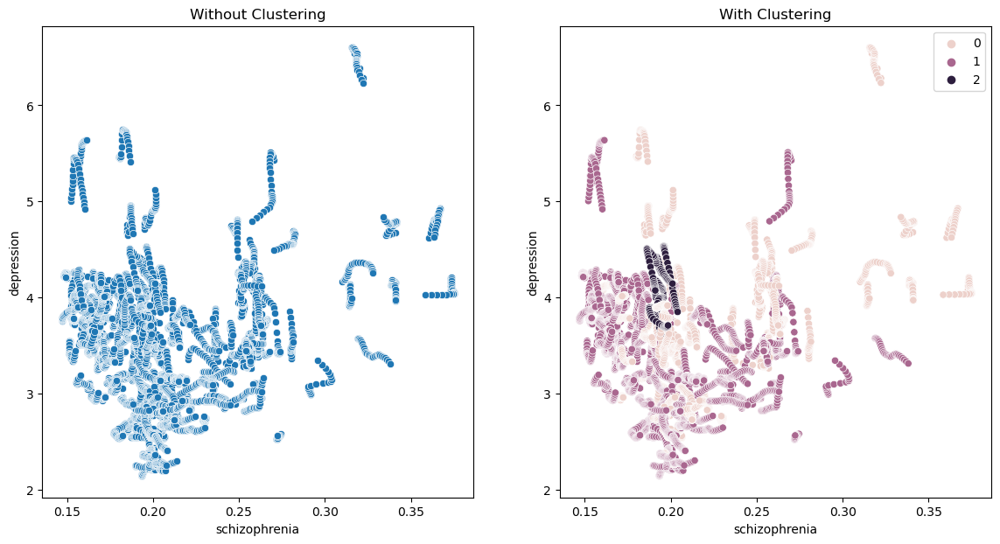

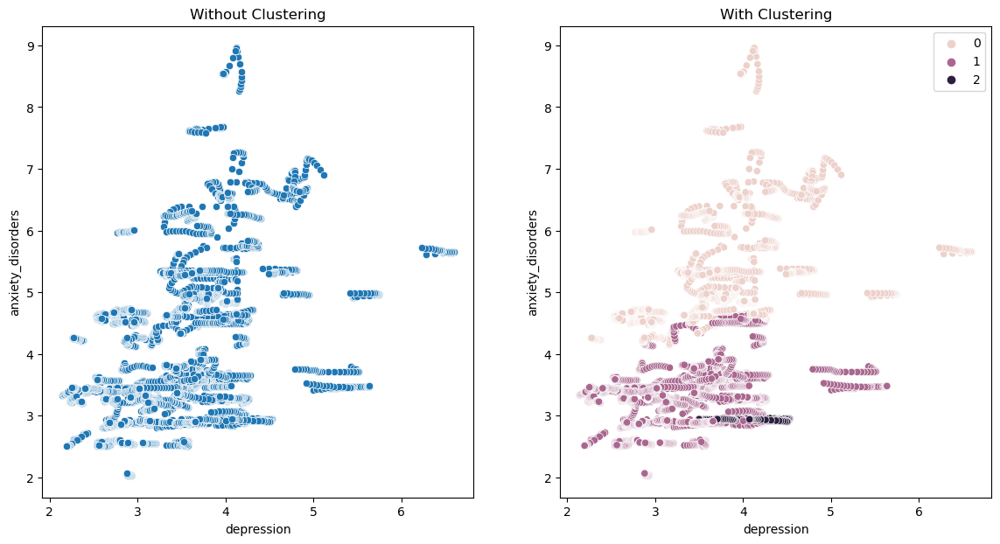

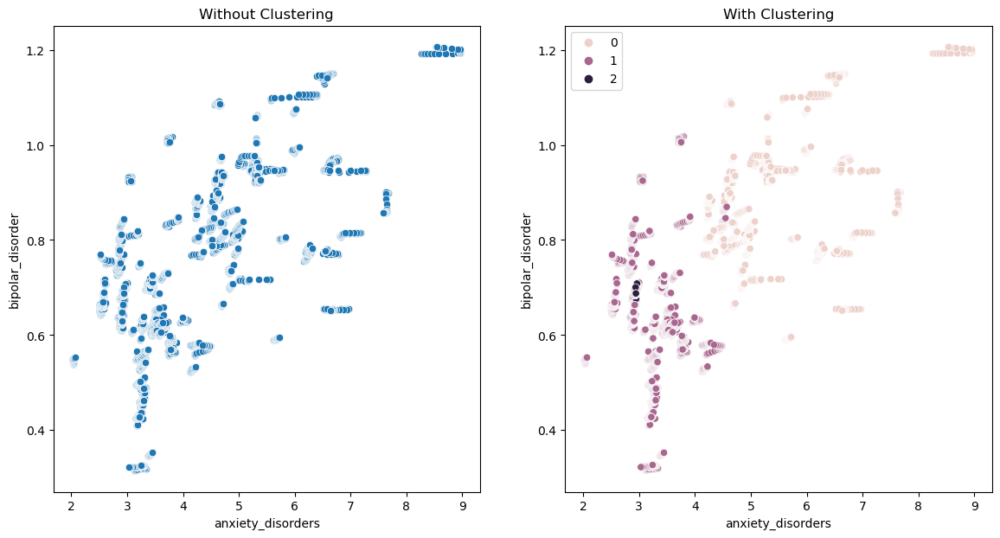

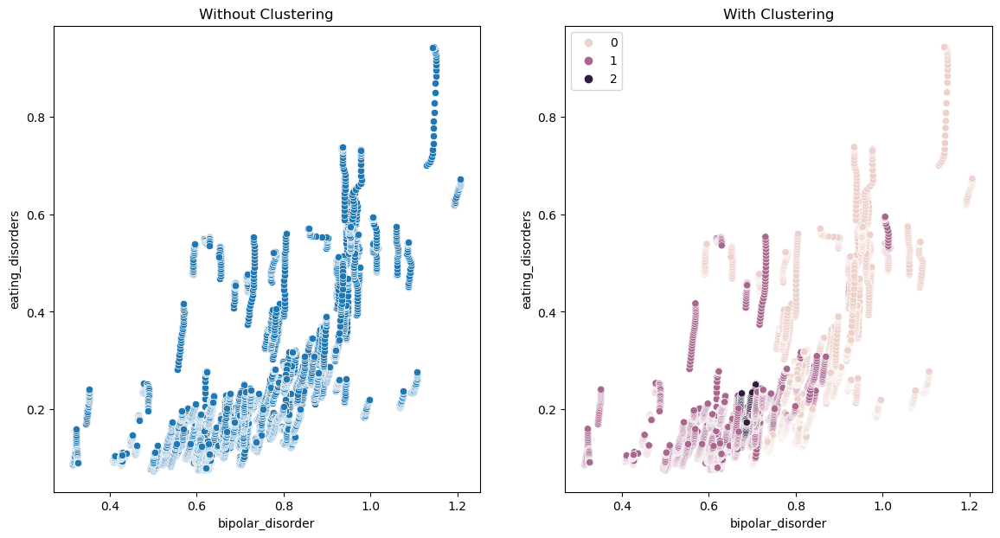

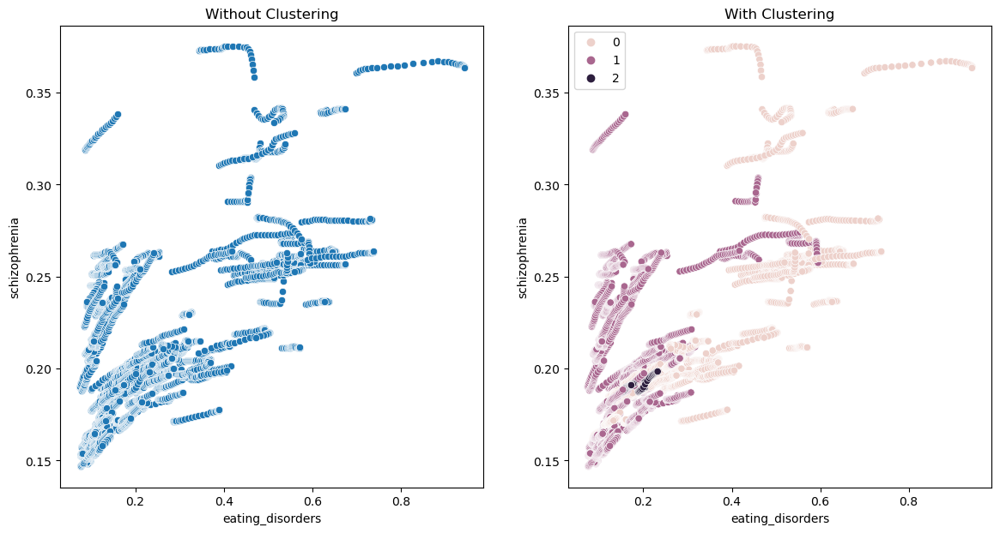

...

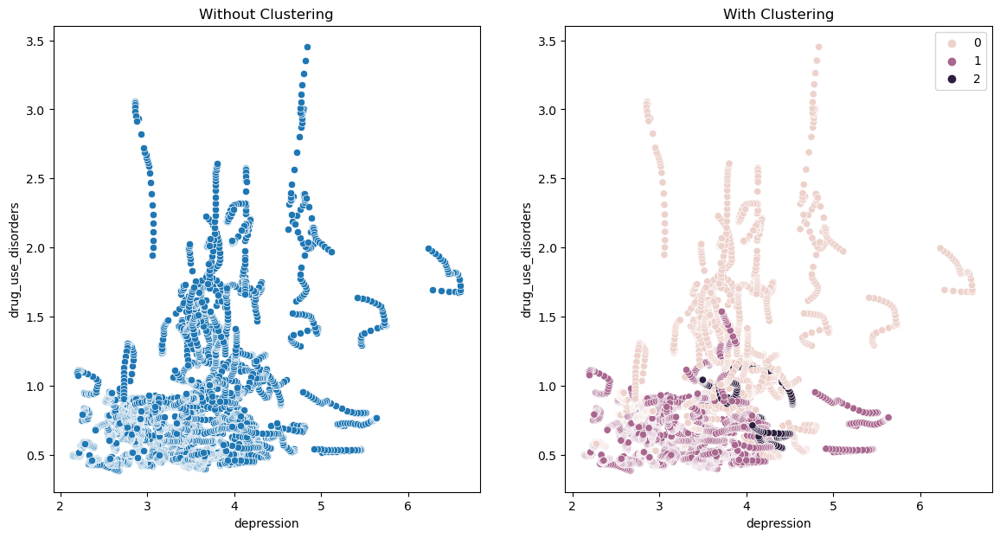

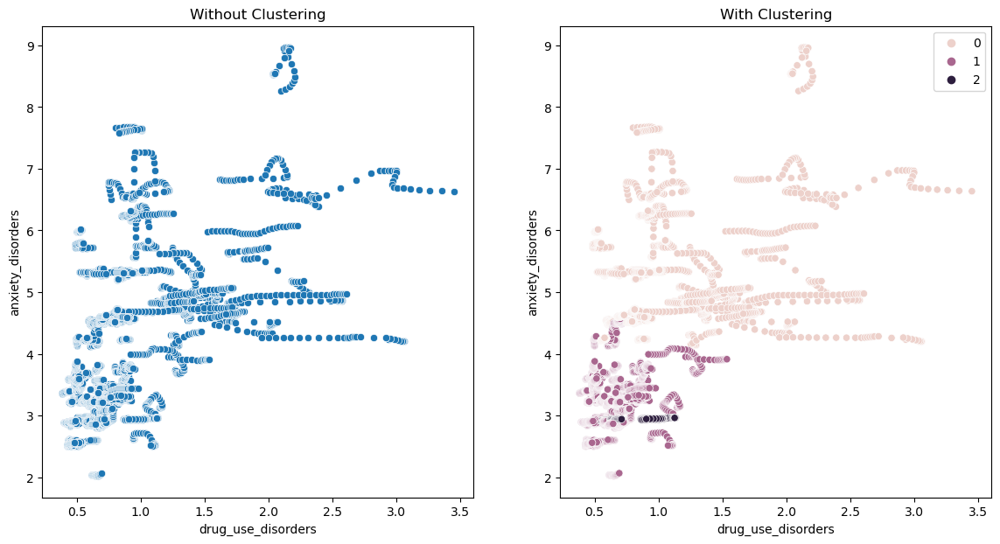

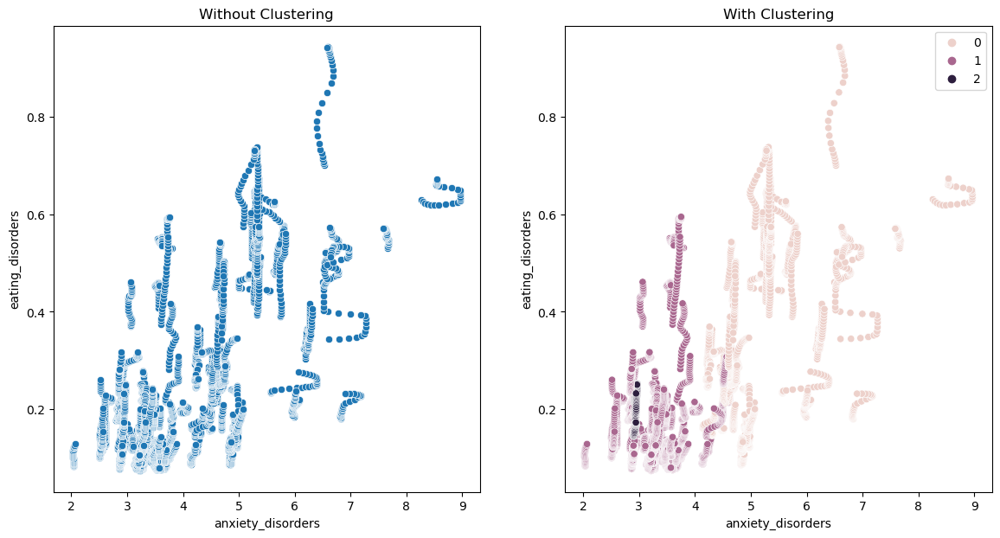

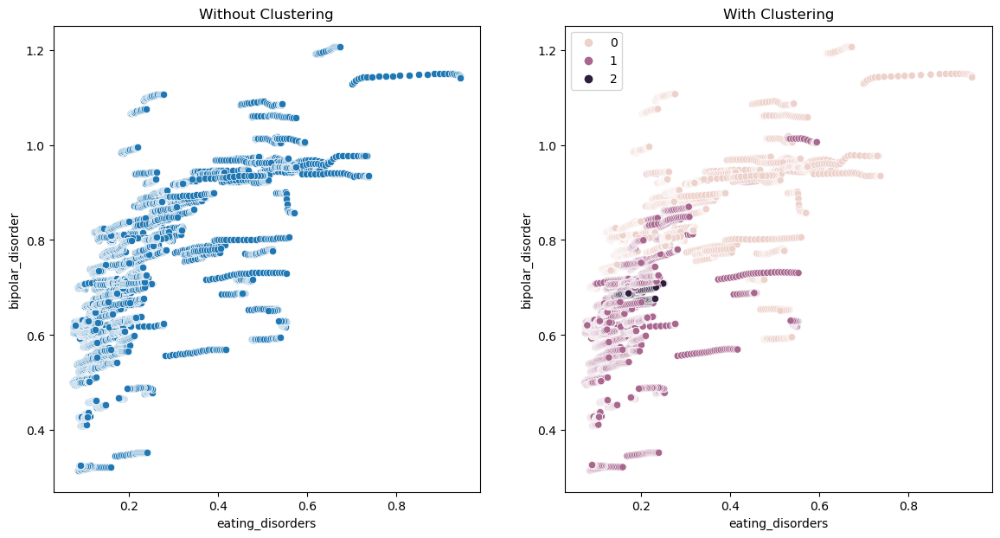

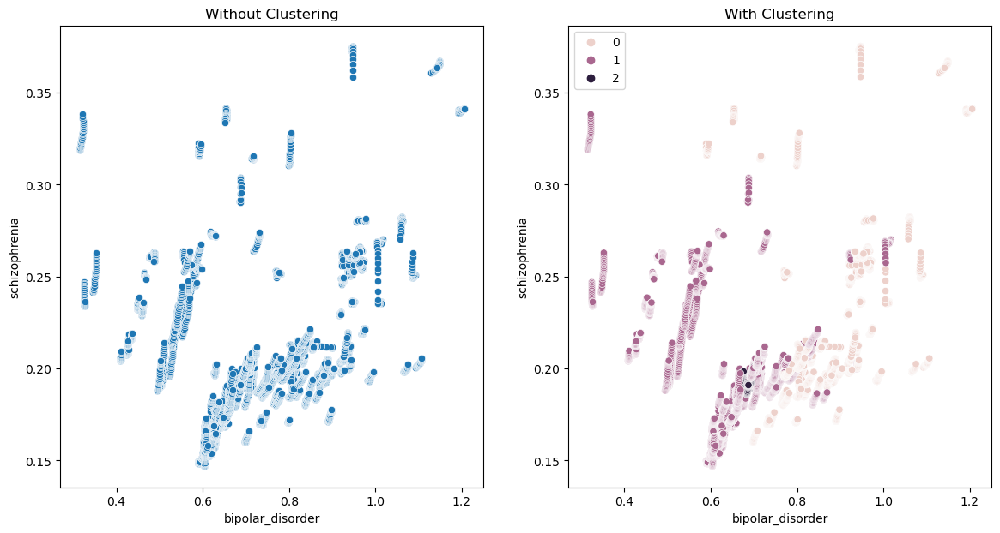

In [48]:


# Schizophrenia vs Depression
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='schizophrenia', y='depression').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='schizophrenia', y='depression', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Depression vs Anxiety Disorders
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='depression', y='anxiety_disorders').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='depression', y='anxiety_disorders', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Anxiety Disorders vs Bipolar Disorder
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='anxiety_disorders', y='bipolar_disorder').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='anxiety_disorders', y='bipolar_disorder', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Bipolar Disorder vs Eating Disorders
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='bipolar_disorder', y='eating_disorders').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='bipolar_disorder', y='eating_disorders', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Eating Disorders vs Schizophrenia
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='eating_disorders', y='schizophrenia').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='eating_disorders', y='schizophrenia', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Schizophrenia vs Alcohol Use Disorders
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='schizophrenia', y='alcohol_use_disorders').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='schizophrenia', y='alcohol_use_disorders', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Alcohol Use Disorders vs Depression
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='alcohol_use_disorders', y='depression').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='alcohol_use_disorders', y='depression', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Depression vs Drug Use Disorders
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='depression', y='drug_use_disorders').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='depression', y='drug_use_disorders', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Drug Use Disorders vs Anxiety Disorders
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='drug_use_disorders', y='anxiety_disorders').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='drug_use_disorders', y='anxiety_disorders', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Anxiety Disorders vs Eating Disorders
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='anxiety_disorders', y='eating_disorders').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='anxiety_disorders', y='eating_disorders', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Eating Disorders vs Bipolar Disorder
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='eating_disorders', y='bipolar_disorder').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='eating_disorders', y='bipolar_disorder', data=df, hue=agg_cluster.labels_).set_title('With Clustering')

# Bipolar Disorder vs Schizophrenia
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
sns.scatterplot(ax=ax[0], data=df, x='bipolar_disorder', y='schizophrenia').set_title('Without Clustering')
sns.scatterplot(ax=ax[1], x='bipolar_disorder', y='schizophrenia', data=df, hue=agg_cluster.labels_).set_title('With Clustering')






In [49]:
kmeans = KMeans(
init="random",
n_clusters=3,
n_init=10,
max_iter=300,
random_state=42)

In [50]:
cluster_km = kmeans.fit(df[features])


In [51]:
cluster_km.inertia_


6859.357011987252

In [52]:
cluster_km.cluster_centers_

array([[0.19661854, 0.71425936, 0.21290329, 2.91073387, 0.73546777,
        3.8864569 , 4.13881637],
       [0.23199567, 0.87983713, 0.38259065, 5.41622181, 1.28294269,
        3.88591326, 1.30077892],
       [0.19883777, 0.64618032, 0.1712135 , 3.39888199, 0.64624433,
        3.25904352, 1.44863722]])

In [53]:
n_init = 10
max_iter = 300
random_state = 42

kmeans_kw = {
    "init": "random",
    "n_init": n_init,
    "max_iter": max_iter,
    "random_state": random_state
}

In [54]:
iner = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kw)
    kmeans.fit(df[features])
    iner.append(kmeans.inertia_)


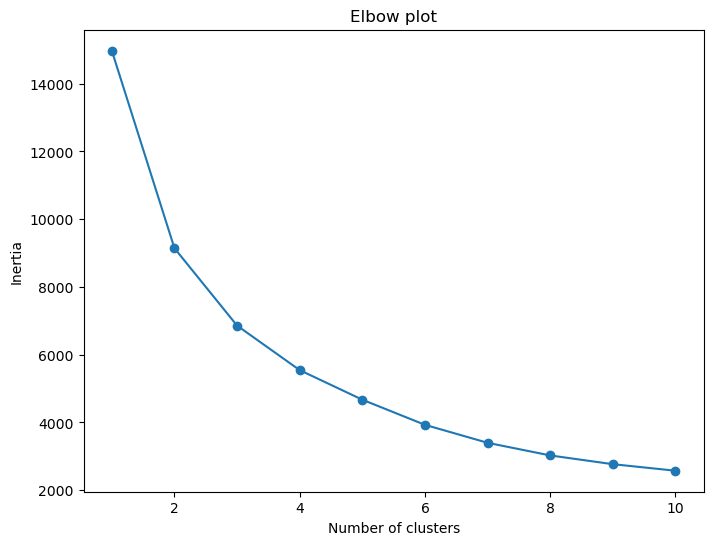

In [55]:
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), iner, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow plot')
plt.show()